Laboratorio N°02 - PSeI

---



INTEGRANTES:

*   Romero Zavaleta, Joshep Andrés
*   Rodríguez Alva, Luis fernando
*   Moreno Lozada, Sofía

In [ ]:
!wget -nc /content/sample_data/Ladrido.wav
!pip install pysoundfile
!pip install bitstring

import numpy as np
import matplotlib.pyplot as plt
import pylab as pl
import time
from IPython import display
plt.style.use(['dark_background']) #Para tener oscuras las graficas

/content/sample_data/Ladrido.wav: Scheme missing.


In [ ]:
import IPython
IPython.display. Audio ("/content/sample_data/Ladrido.wav")

HACEMOS LA LECTURA DE AUDIO:

Tasa de muestreo: () muestras/segundo
Tamaño de la señal: 560128 muestras
Duración: 12.701 segundos


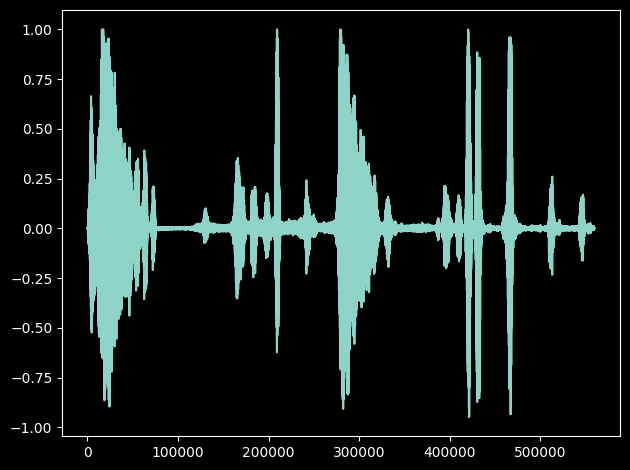

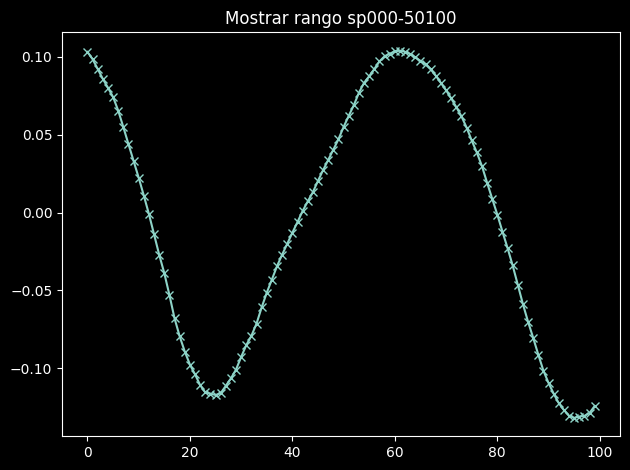

In [ ]:
import soundfile
import matplotlib.pyplot as plt

audio_senial, sampling_rate = soundfile.read("/content/sample_data/Ladrido.wav")
type(audio_senial)
print('Tasa de muestreo: () muestras/segundo'.format(sampling_rate))
print('Tamaño de la señal: {} muestras'.format(audio_senial.shape[0]))
print('Duración: {:.3f} segundos'.format(audio_senial.shape[0] / sampling_rate))
plt.plot(audio_senial)
plt.tight_layout()
plt.figure()
plt.plot(audio_senial [50000:50100], marker='x')
plt.title("Mostrar rango sp000-50100")
plt.tight_layout()

LIBRERIAS ADICIONALES:

In [ ]:
import numpy as np
import scipy.fft as fourier
import matplotlib.pyplot as plt
import scipy.signal
import scipy.io.wavfile as waves
import ipywidgets as widgets
from matplotlib import animation, patches, rc
import matplotlib as mpl
from IPython.display import YouTubeVideo, HTML, Audio

GENERAMOS NUESTRA SEÑAL:

In [ ]:
fm = sampling_rate #Frecuencia de muestreo
t = np.arange(0, len(audio_senial))/fm #Vector tiempo
n = len(t) #Longitud total de señal
#p = 20 #Longitud máxima de la señal a generar
#amplitud_ruido = 5 #Escalamiento del ruido a generar

amplitud = audio_senial #Señal generada
#ruido = amplitud * np.random.randn(n)

senial_ruidosa = amplitud #+ ruido

print(n)
print(fm)

560128
44100


SEÑAL GENERADA:

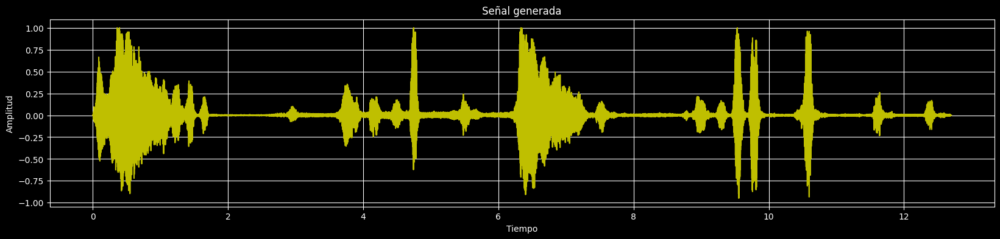

In [ ]:
plt.subplots(1,1, figsize=(20,4))

plt.subplot(111)
plt.plot(t,amplitud,"y")
plt.title("Señal generada")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.grid()

plt.show()

CREAMOS EL KERNEL GAUSSIANO:

In [ ]:
#Creando el kernel
kernel = np.exp(-np.linspace(-2,2,31) **2) #funcion gausiana, ultimo dato del parentesis interior da el numero-1
kernel = kernel/sum(kernel)
N= len(amplitud) #longitud de la señal

MOSTRAMOS SEÑALES CREADAS:

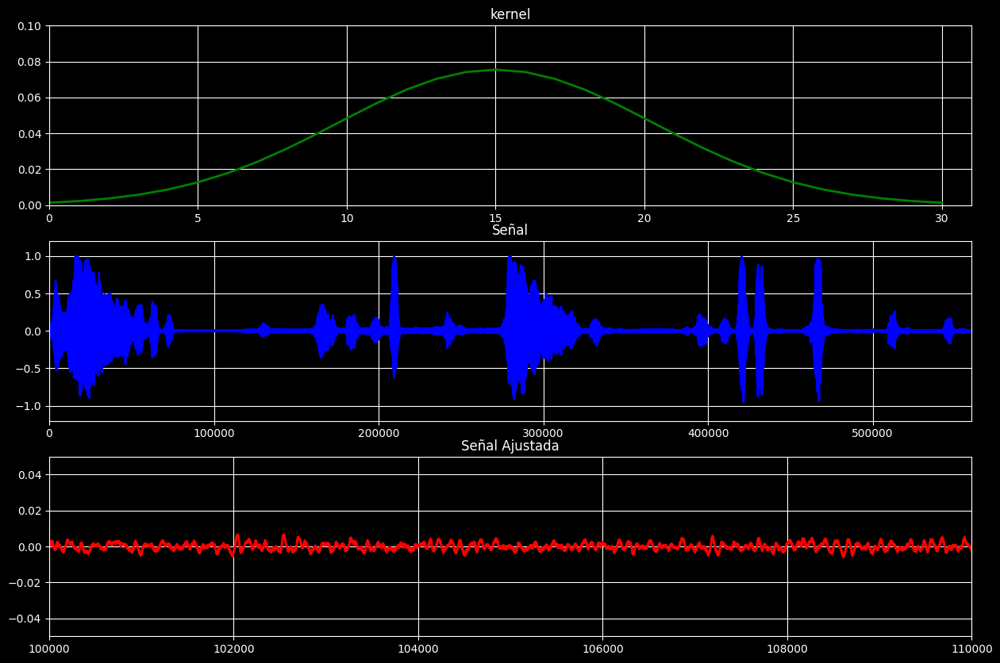

In [ ]:
plt.figure(figsize=(15,10)) #Estableciendo el tamaño de la gráfica

#Gráfica del Kernel:

plt.subplot(311)
plt.plot(kernel, 'g', linewidth=2)
plt.xlim([0, N]) #Limitamos el eje x entre 0 y N
plt.title('kernel')
plt.axis([0, 31, 0,0.1])
plt.grid()

#Gráfica de la señal:

plt.subplot(312)
plt.plot(amplitud, 'b', linewidth=2,)
plt.xlim([0, N]) #Limitamos el eje x entre 0 y N
plt.title('Señal')
plt.axis([0, 560128, -1.2, 1.2])
plt.grid()

#Gráfica de la señal AJUSTADA:

plt.subplot(313)
plt.plot(amplitud, 'r', linewidth=2,)
plt.xlim([0, N]) #Limitamos el eje x entre 0 y N
plt.title('Señal Ajustada')
plt.grid()
plt.axis([100000, 110000, -0.05, 0.05])

plt.show()

RESULTADO DE CONVOLUCIÓN:

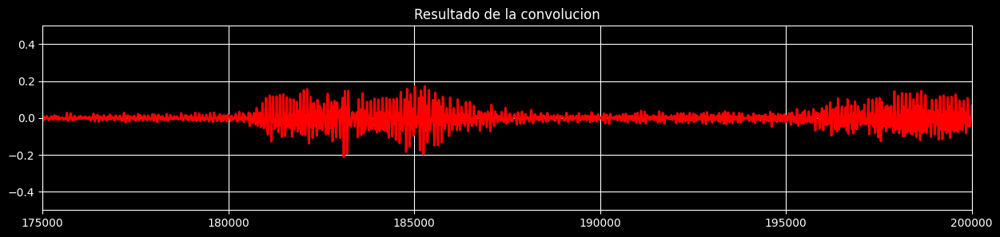

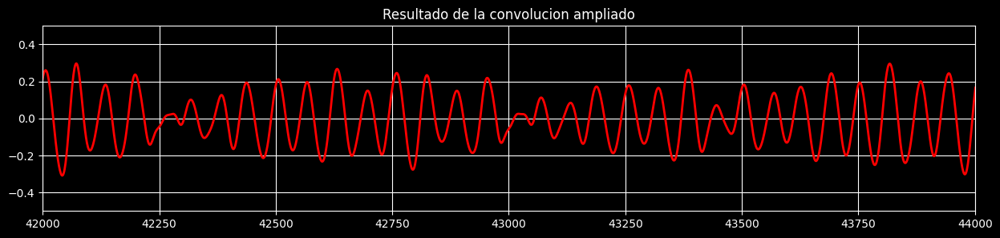

In [ ]:
resultado = np.convolve(amplitud, kernel, 'same') # El 'same indica que el resultado debe ser recortado y tener las mismas dimensiones que la señal
                                                  # de entrada. Si se desea el resultado completo se puede usar "full" y no limitar el eje x.

plt.figure(figsize=(15,3))

plt.plot(resultado, 'r',linewidth=2)
plt.xlim([0,N]) #Limitamos el eje x entre 0 y N
plt.title('Resultado de la convolucion')
plt.grid()
plt.axis([175000, 200000, -0.5, 0.5])

plt.figure(figsize=(15,3))

plt.plot(resultado, 'r',linewidth=2)
plt.xlim([0,N]) #Limitamos el eje x entre 0 y N
plt.title('Resultado de la convolucion ampliado')
plt.grid()
plt.axis([42000, 44000, -0.5, 0.5])

plt.show()

GRAFICA DE COMPARACIÓN:

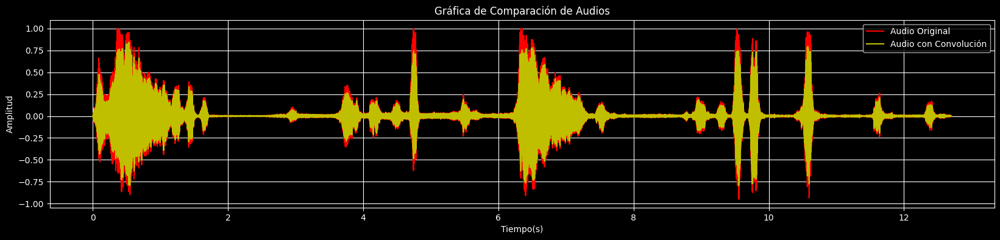

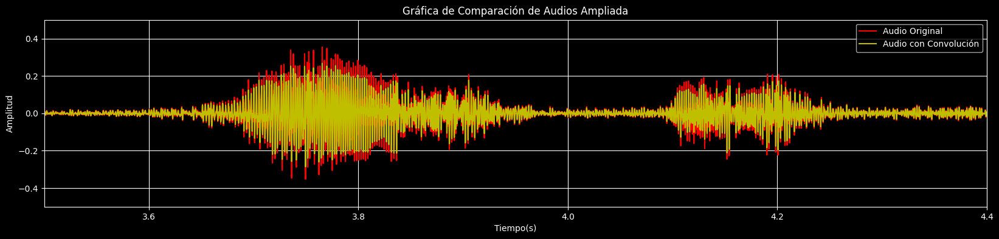

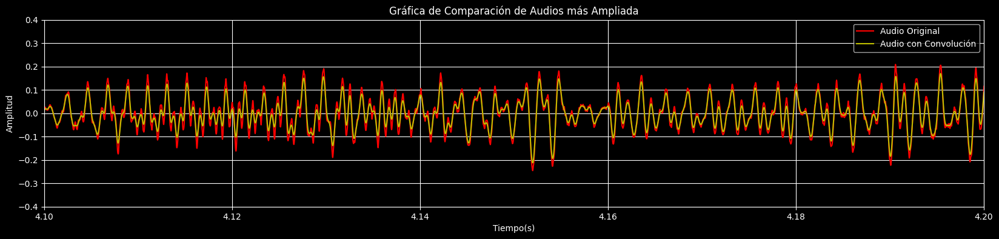

In [ ]:
plt.subplots(figsize=(20,4))

plt.plot(t, senial_ruidosa,"r", label="Audio Original")
plt.plot(t,resultado,"y",label="Audio con Convolución")
plt.title("Gráfica de Comparación de Audios")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_ruidosa,"r", label="Audio Original")
plt.plot(t,resultado,"y",label="Audio con Convolución")
plt.title("Gráfica de Comparación de Audios Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([3.5, 4.4, -0.5, 0.5])
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_ruidosa,"r", label="Audio Original")
plt.plot(t,resultado,"y",label="Audio con Convolución")
plt.title("Gráfica de Comparación de Audios más Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([4.1, 4.2, -0.4, 0.4])
plt.grid()
plt.legend()

plt.show()

MOSTRAMOS RESULTADO Y COMPARAMOS:

In [ ]:
IPython.display. Audio ("/content/sample_data/Ladrido.wav") # Audio Original

In [ ]:
Audio(resultado, rate = fm) # Resultado de Convolución

¿Que efecto sonoro identifica entre el audio original y el modificado?

- Se puede apreciar que en el audio original el sonido es más grabe y se puede apreciar el ruido del mismo, mientras que para el audio con filtro de convolución el sonido es más tenue y suave debido a que el ruido ya no esta muy presente.

**TEST DE COMPROBACION:**

	¿Si en el ejercicio usa la función 'correlate' en vez de 'convolve', que diferencias en la forma y sonoras se tendría en la señal de salida?. Explique.

RESULTADO DE CORRELATE:

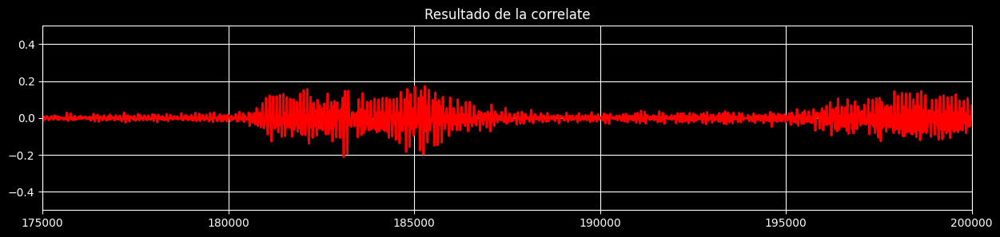

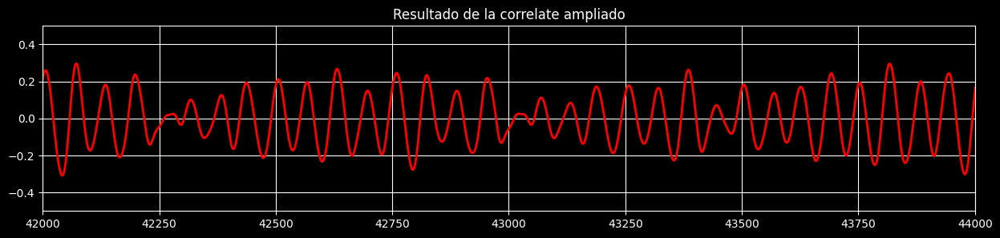

In [ ]:
resultado2 = np.correlate(amplitud, kernel, 'same') # El 'same indica que el resultado debe ser recortado y tener las mismas dimensiones que la señal
                                                  # de entrada. Si se desea el resultado completo se puede usar "full" y no limitar el eje x.

plt.figure(figsize=(15,3))

plt.plot(resultado2, 'r',linewidth=2)
plt.xlim([0,N]) #Limitamos el eje x entre 0 y N
plt.title('Resultado de la correlate')
plt.grid()
plt.axis([175000, 200000, -0.5, 0.5])

plt.figure(figsize=(15,3))

plt.plot(resultado2, 'r',linewidth=2)
plt.xlim([0,N]) #Limitamos el eje x entre 0 y N
plt.title('Resultado de la correlate ampliado')
plt.grid()
plt.axis([42000, 44000, -0.5, 0.5])

plt.show()

GRAFICA DE COMPARACIÓN:

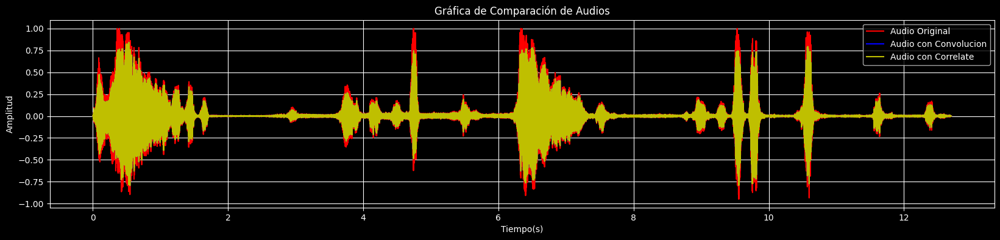

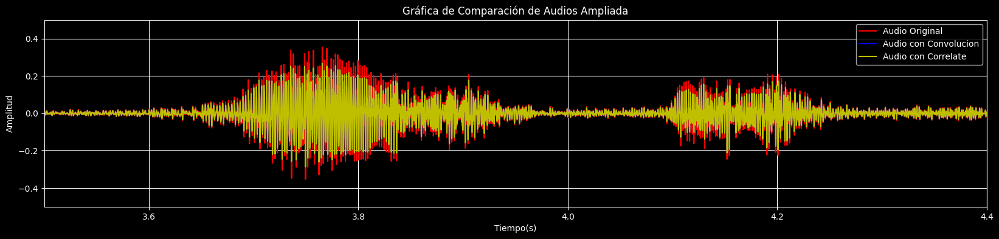

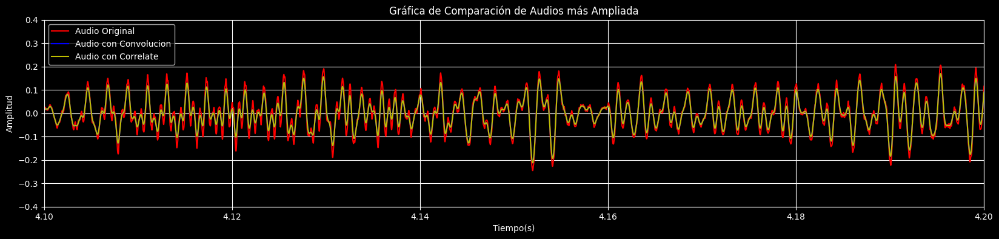

In [ ]:
plt.subplots(figsize=(20,4))

plt.plot(t, senial_ruidosa,"r", label="Audio Original")
plt.plot(t,resultado,"b",label="Audio con Convolucion")
plt.plot(t,resultado2,"y",label="Audio con Correlate")
plt.title("Gráfica de Comparación de Audios")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_ruidosa,"r", label="Audio Original")
plt.plot(t,resultado,"b",label="Audio con Convolucion")
plt.plot(t,resultado2,"y",label="Audio con Correlate")
plt.title("Gráfica de Comparación de Audios Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([3.5, 4.4, -0.5, 0.5])
plt.grid()
plt.legend()

plt.subplots(figsize=(20,4))

plt.plot(t, senial_ruidosa,"r", label="Audio Original")
plt.plot(t,resultado,"b",label="Audio con Convolucion")
plt.plot(t,resultado2,"y",label="Audio con Correlate")
plt.title("Gráfica de Comparación de Audios más Ampliada")
plt.xlabel('Tiempo(s)')
plt.ylabel('Amplitud')
plt.axis([4.1, 4.2, -0.4, 0.4])
plt.grid()
plt.legend()

plt.show()

In [ ]:
IPython.display. Audio ("/content/sample_data/Ladrido.wav") # Audio Original

In [ ]:
Audio(resultado, rate = fm) # Resultado de Convolucion

In [ ]:
Audio(resultado2, rate = fm) # Resultado de Correlate

Si escuchamos los sonidos luego de haber usado convolucion y correlate respectivamente para el audio no se llega a notar satisfactoriamente la diferencia pero si vemos la grafiaca resultante si podemos apreciar el cambio  que existe entre ambas funciones.